# Plot 3D results nicely

In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from astropy.io import fits
# %matplotlib widget


In [2]:
CFIS_pattern = ['validation_psf-{:07d}-'+str(k)+'.fits' for k in range(40)]

def plot_ell(my_path, file_pattern = 'validation_psf-38-{:06d}.fits', n_starcats = 453, n_test_stars = 10):

    e1_stars = np.zeros((n_test_stars,n_starcats))
    e1_psfs = np.zeros((n_test_stars,n_starcats))
    e2_stars = np.zeros((n_test_stars,n_starcats))
    e2_psfs = np.zeros((n_test_stars,n_starcats))


    for k in range(n_starcats):
        model = fits.open(my_path + file_pattern.format(k))
        e1_stars[:,k] = model[2].data['E1_STAR_HSM']
        e1_psfs[:,k] = model[2].data['E1_PSF_HSM']
        e2_stars[:,k] = model[2].data['E2_STAR_HSM']
        e2_psfs[:,k] = model[2].data['E2_PSF_HSM']
        model.close()
    model = fits.open(my_path + file_pattern.format(0))
    X = model[2].data['X']
    Y = model[2].data['Y']
    model.close()

    e1_star_mean = np.mean(e1_stars, axis = 1)
    e1_star_med = np.median(e1_stars, axis = 1)
    e1_star_std = np.std(e1_stars, axis = 1)
    e2_star_mean = np.mean(e2_stars, axis = 1)
    e2_star_med = np.median(e2_stars, axis = 1)
    e2_star_std = np.std(e2_stars, axis = 1)

    e1_psf_mean = np.mean(e1_psfs, axis = 1)
    e1_psf_med = np.median(e1_psfs, axis = 1)
    e1_psf_std = np.std(e1_psfs, axis = 1)
    e2_psf_mean = np.mean(e2_psfs, axis = 1)
    e2_psf_med = np.median(e2_psfs, axis = 1)
    e2_psf_std = np.std(e2_psfs, axis = 1)
    
    e1_err = e1_star_mean - e1_psf_mean
    e2_err = e2_star_mean - e2_psf_mean
    

    x_min = (np.max(X) + np.min(X) - max(np.max(X) - np.min(X), np.max(Y) - np.min(Y))) / 2
    x_max = (np.max(X) + np.min(X) + max(np.max(X) - np.min(X), np.max(Y) - np.min(Y))) / 2
    y_min = (np.max(Y) + np.min(Y) - max(np.max(X) - np.min(X), np.max(Y) - np.min(Y))) / 2
    y_max = (np.max(Y) + np.min(Y) + max(np.max(X) - np.min(X), np.max(Y) - np.min(Y))) / 2

    fig = plt.figure()
    fig.set_figheight(10)
    #fig.set_figwidth(10)
    
    ax = fig.add_subplot(211, projection = '3d')
    ax.set_xlim3d(x_min, x_max)
    ax.set_ylim3d(y_min, y_max)
    ax.scatter(X, Y, e1_star_mean)
    ax.scatter(X, Y, e1_psf_mean)
    ax.title.set_text('e1')
    plt.show()
    
    #fig2 = plt.figure()
    ax2 = fig.add_subplot(212, projection = '3d')
    ax2.set_xlim3d(x_min, x_max)
    ax2.set_ylim3d(y_min, y_max)
    ax2.scatter(X, Y, e2_star_mean)
    ax2.scatter(X, Y, e2_psf_mean)
    ax2.title.set_text('e2')
    plt.show()
    
    return e1_err, e2_err, X, Y



def plot_color2d(mat1,mat2,save_path):
    # Plot matrices into a color 2D map
    """
    import matplotlib as mpl
    from matplotlib.colors import ListedColormap, LinearSegmentedColormap
    """  
    
    # Calculate errors
    idx1, idx2 = np.nonzero(mat1)
    RMSE_e1 = rmse(mat1[idx1, idx2])
    
    idx1, idx2 = np.nonzero(mat2)
    RMSE_e2 = rmse(mat2[idx1, idx2])
    
    # Define the color map to be used
    top = mpl.cm.get_cmap('Oranges_r', 128)
    bottom = mpl.cm.get_cmap('Blues', 128)
    newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                           bottom(np.linspace(0, 1, 128))))
    newcmp = ListedColormap(newcolors, name='OrangeBlue')
    
    # Generate figure
    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    
    vmax1 = 0.01 # e1 resolution
    vmax2 = 0.002 # e2 resolution
    
    # First subplot
    #vmax1 = np.max([abs(np.max(mat1)), abs(np.min(mat1))])
    psm = axs[0].pcolormesh(mat1.T, cmap=newcmp, rasterized=True, vmin = -vmax1, vmax = vmax1)
    axs[0].title.set_text('e1 error')
    fig.colorbar(psm, ax=axs[0])
    axs[0].set_xlabel('x \n RMSE: ' + "%.6f"%RMSE_e1)
    axs[0].set_ylabel('y')
    
    # Second subplot
    # vmax2 = np.max([abs(np.max(mat2)), abs(np.min(mat2))])
    psm = axs[1].pcolormesh(mat2.T, cmap=newcmp, rasterized=True, vmin = -vmax2, vmax = vmax2)
    axs[1].title.set_text('e2 error')
    fig.colorbar(psm, ax=axs[1])
    axs[1].set_xlabel('x \n RMSE: ' + "%.6f"%RMSE_e2)
    axs[1].set_ylabel('y')
    
    plt.show()
    plt.savefig(save_path)
    
    
    
def gen_err_mat(err_vec_1, err_vec_2, X, Y):
    # Generate the error matrix from the error vector
    # accounting for its position on the grid
    X_unique = np.load('X_unique.npy')
    Y_unique = np.load('Y_unique.npy')
    x_len = len(X_unique)
    y_len = len(Y_unique)

    e1_mat = np.zeros((x_len,y_len))
    e2_mat = np.zeros((x_len,y_len))

    for it in range(len(X)):
        x_idx = np.where(np.abs(X_unique - X[it]) < 1e-10)[0][0]
        y_idx = np.where(np.abs(Y_unique - Y[it]) < 1e-10)[0][0]

        e1_mat[x_idx,y_idx] = err_vec_1[it]
        e2_mat[x_idx,y_idx] = err_vec_2[it]
        
    return e1_mat, e2_mat

def rmse(vec):
    return np.sqrt(np.mean(vec ** 2))

In [3]:
# Some paths
TL_test_1_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-1/shapepipe_run_2019-12-06_19-49-01/rca_runner/output/'
TL_test_7_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-7/shapepipe_run_2019-12-09_16-23-04/rca_runner/output/'
TL_test_8_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-8/shapepipe_run_2019-12-09_16-25-39/rca_runner/output/'
TL_test_9_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-9/shapepipe_run_2019-12-11_10-48-46/rca_runner/output/'
TL_test_10_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-10/shapepipe_run_2019-12-11_10-51-59/rca_runner/output/'
TL_test_11_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-11/shapepipe_run_2019-12-11_10-57-04/rca_runner/output/'
TL_test_12_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-12/shapepipe_run_2019-12-16_10-13-43/rca_runner/output/'
TL_test_13_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-13/shapepipe_run_2019-12-16_10-15-45/rca_runner/output/'
TL_test_14_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-14/shapepipe_run_2019-12-18_11-29-32/rca_runner/output/'
TL_test_15_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-15/shapepipe_run_2019-12-18_11-31-54/rca_runner/output/'
TL_test_16_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-16/shapepipe_run_2019-12-18_13-11-03/rca_runner/output/'
TL_test_17_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-17/shapepipe_run_2019-12-18_13-16-25/rca_runner/output/'
TL_test_18_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-18/shapepipe_run_2019-12-20_10-24-52/rca_runner/output/'
TL_test_19_path = '/Users/tliaudat/Documents/PhD/codes/venv_p3/tests/output_validation/test-19/shapepipe_run_2019-12-20_10-26-49/rca_runner/output/'









<IPython.core.display.Javascript object>


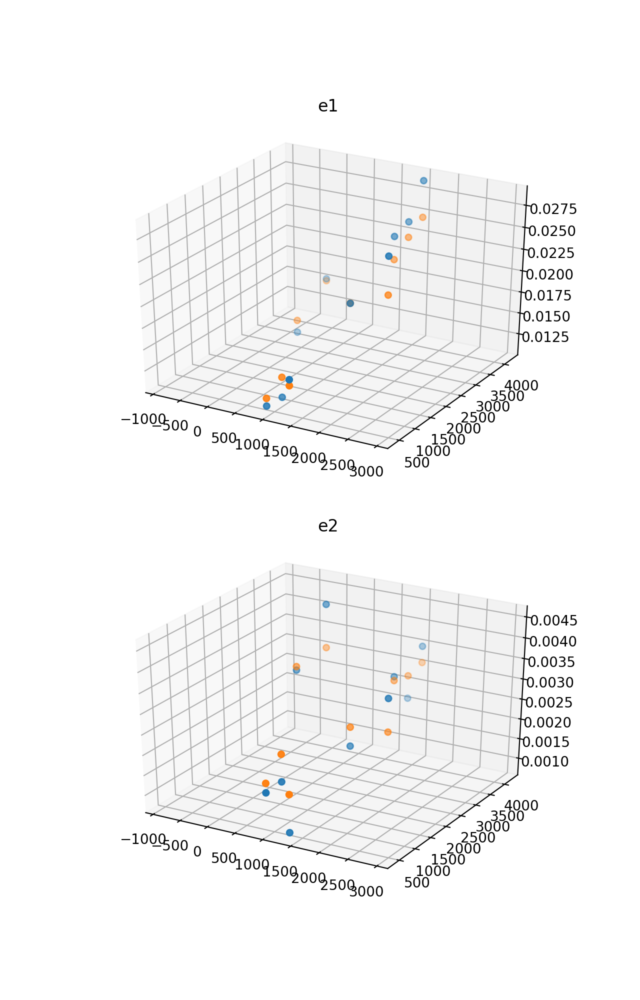

<IPython.core.display.Javascript object>


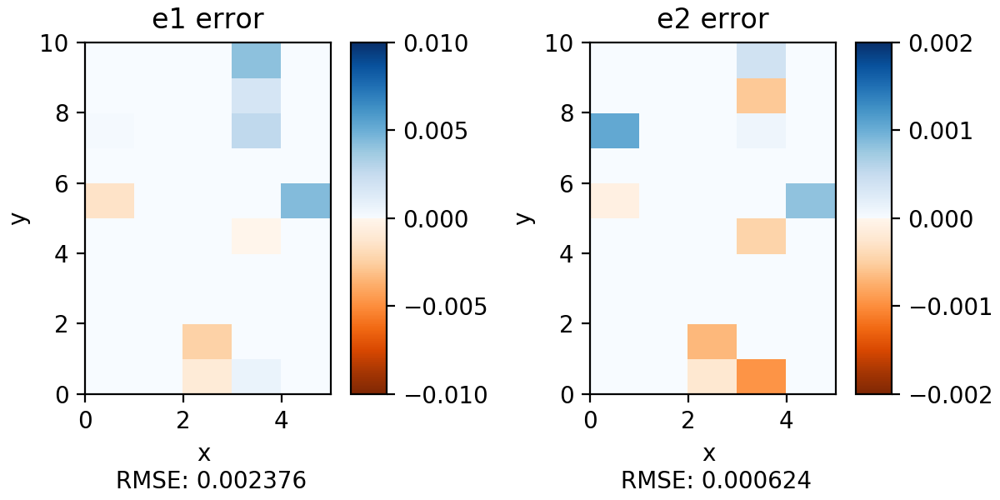

In [4]:
# TL test 1
# Lower noise than in JB dataset

"""
## Test 1
# RCA-specific parameters
N_COMP = 16
PSF_SIZE = 3.6
N_EIGENVECTS = 5
sigmaNoise = 0.4e-3
KSIG = 1
#ALPHA = PSFEx
test_per = 0.8
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_1_path, n_starcats = 453, n_test_stars = 10)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test1.png')

<IPython.core.display.Javascript object>


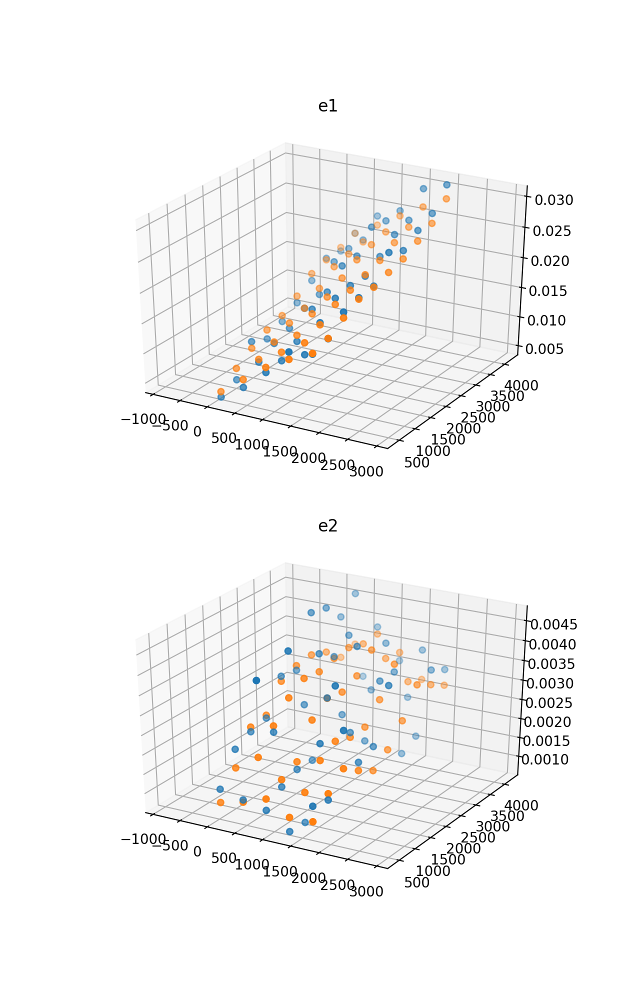

<IPython.core.display.Javascript object>


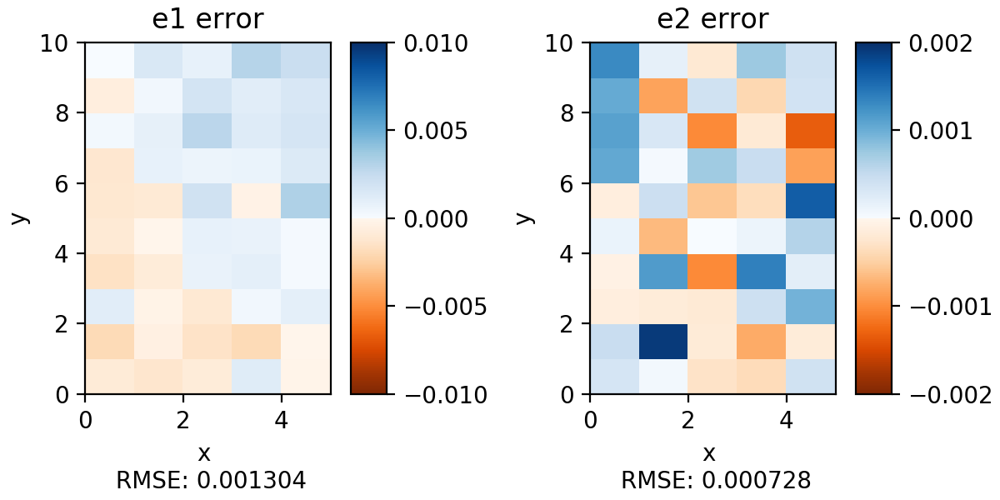

In [5]:
# TL test 7

"""
## Test 7
# RCA-specific parameters
N_COMP = 50
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 1
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_7_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test7.png')

<IPython.core.display.Javascript object>


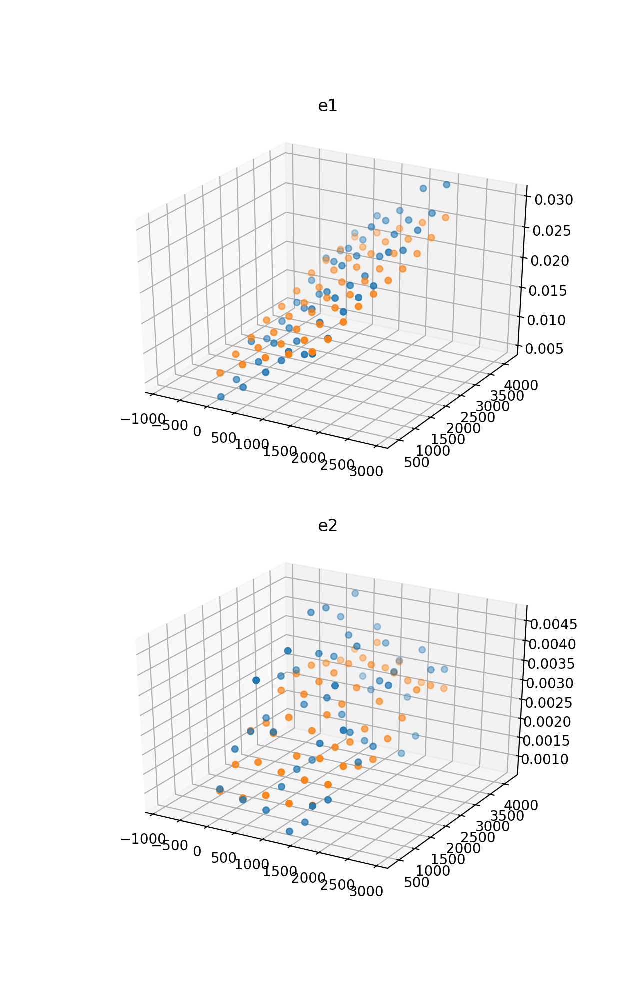

<IPython.core.display.Javascript object>


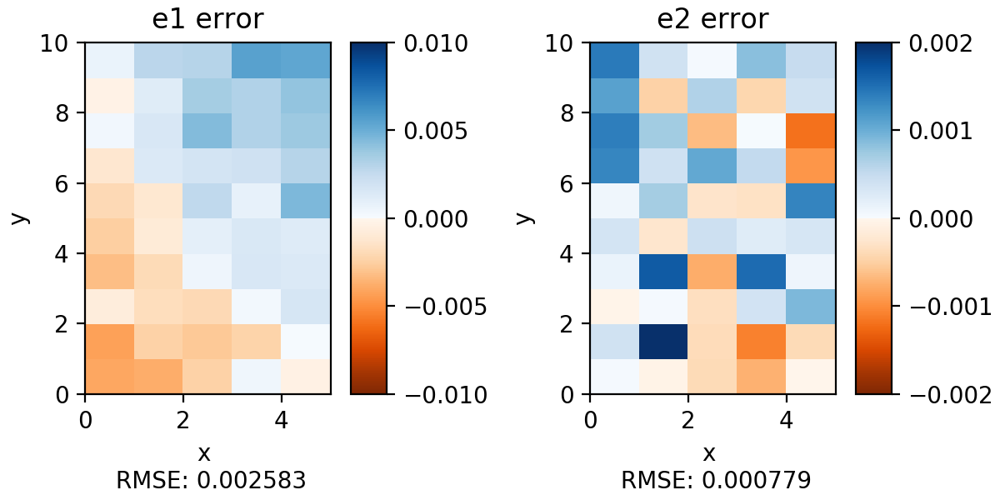

In [6]:
# TL test 8

"""
## Test 8
# RCA-specific parameters
N_COMP = 50
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 3
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_8_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test8.png')

<IPython.core.display.Javascript object>


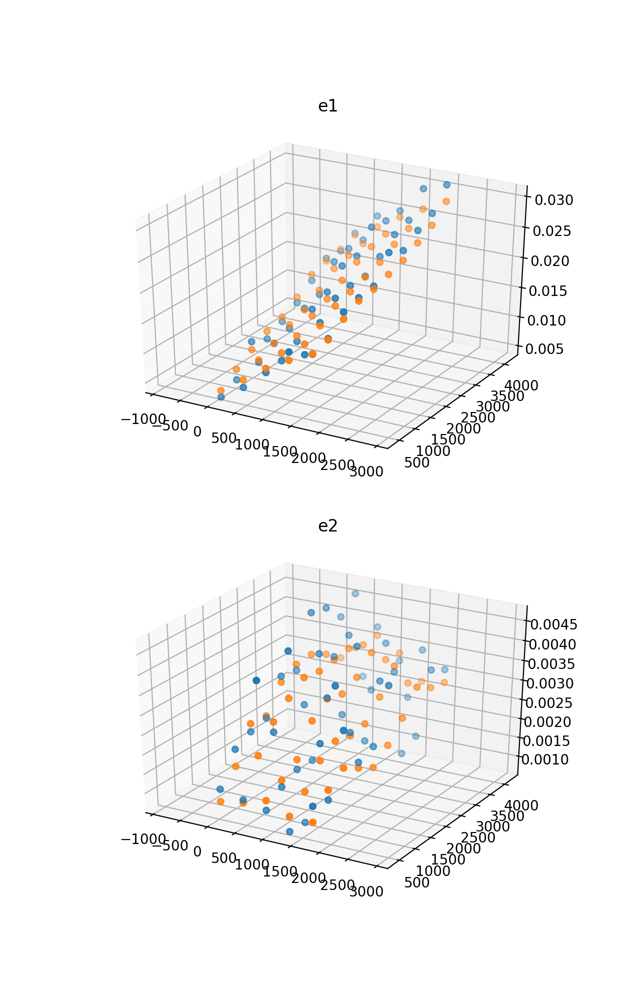

<IPython.core.display.Javascript object>


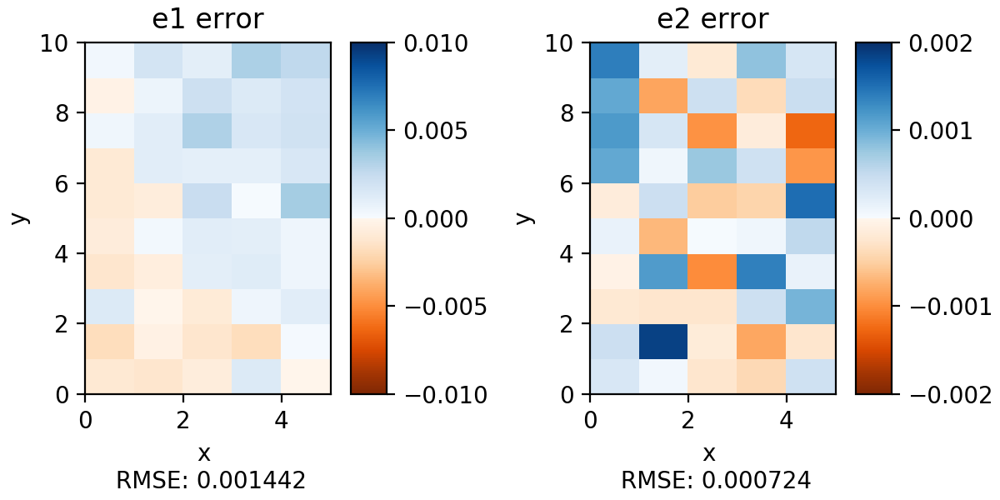

In [7]:
# TL test 9

"""
## Test 9
# RCA-specific parameters
N_COMP = 32
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 1
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_9_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test9.png')

<IPython.core.display.Javascript object>


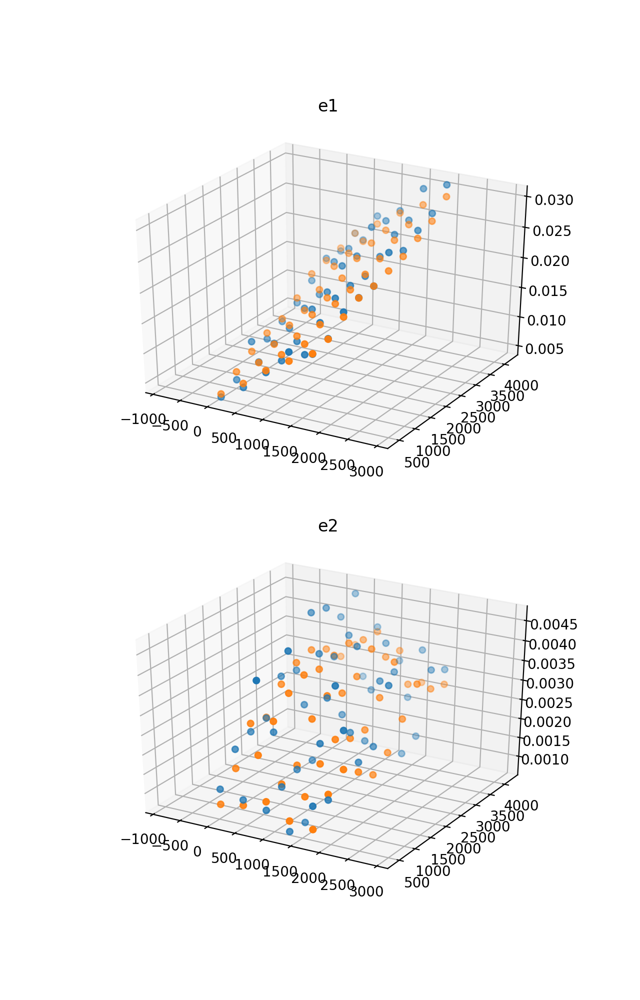

<IPython.core.display.Javascript object>


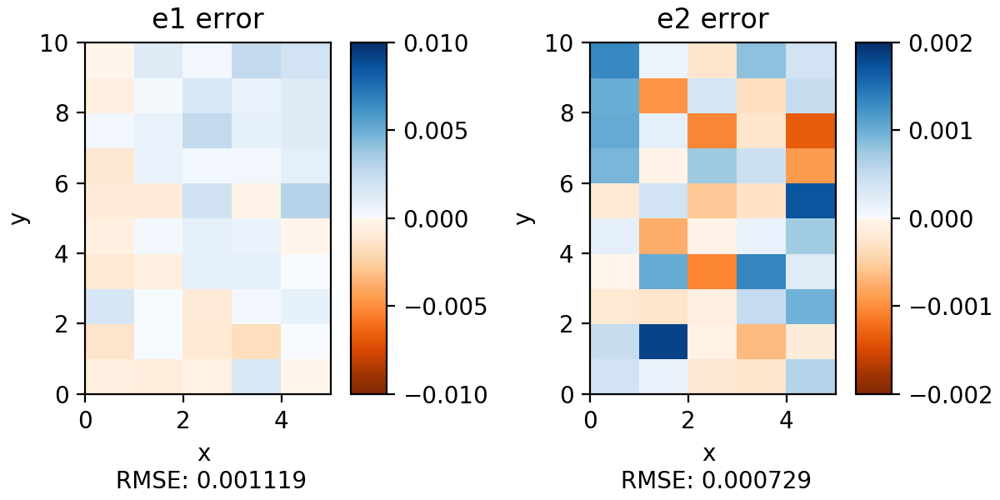

In [8]:
# TL test 10

"""
## Test 10
# RCA-specific parameters
N_COMP = 32
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.5
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_10_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test10.png')

<IPython.core.display.Javascript object>


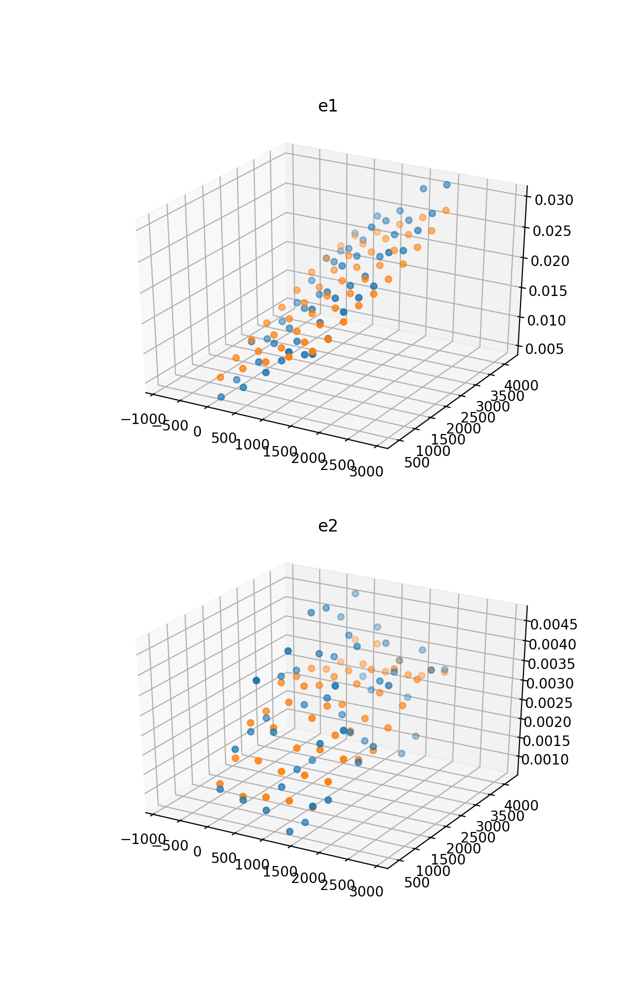

<IPython.core.display.Javascript object>


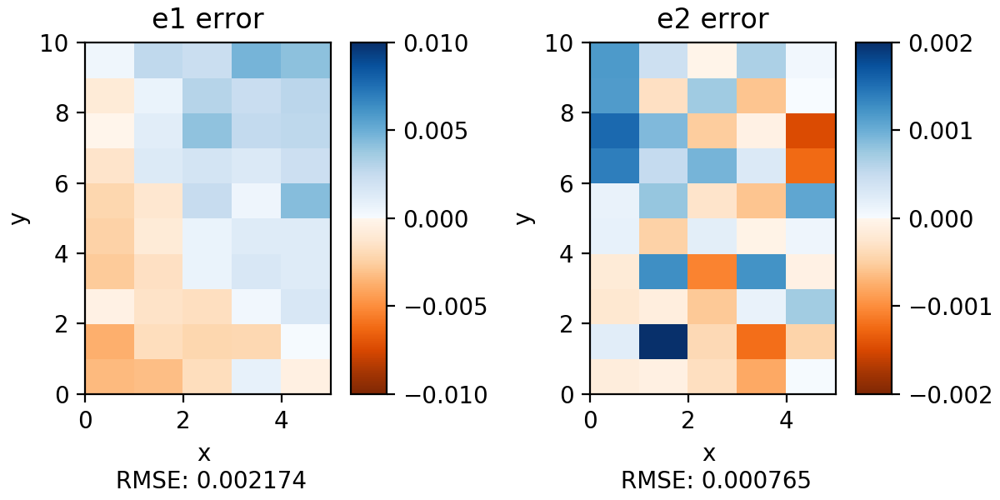

In [9]:
# TL test 11

"""
## Test 11
# RCA-specific parameters
N_COMP = 16
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 1
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_11_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test11.png')

<IPython.core.display.Javascript object>


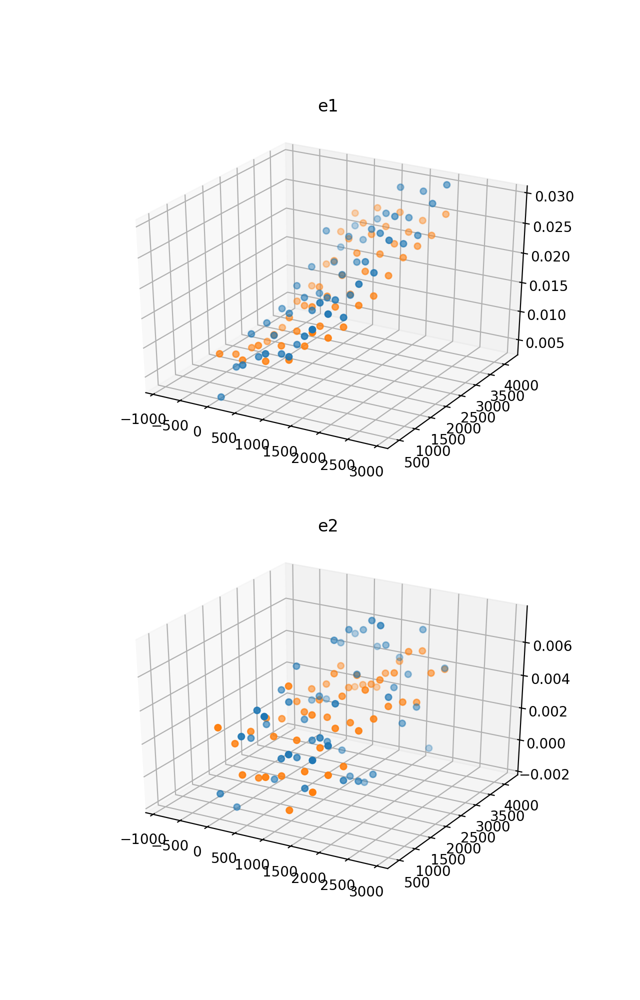

<IPython.core.display.Javascript object>


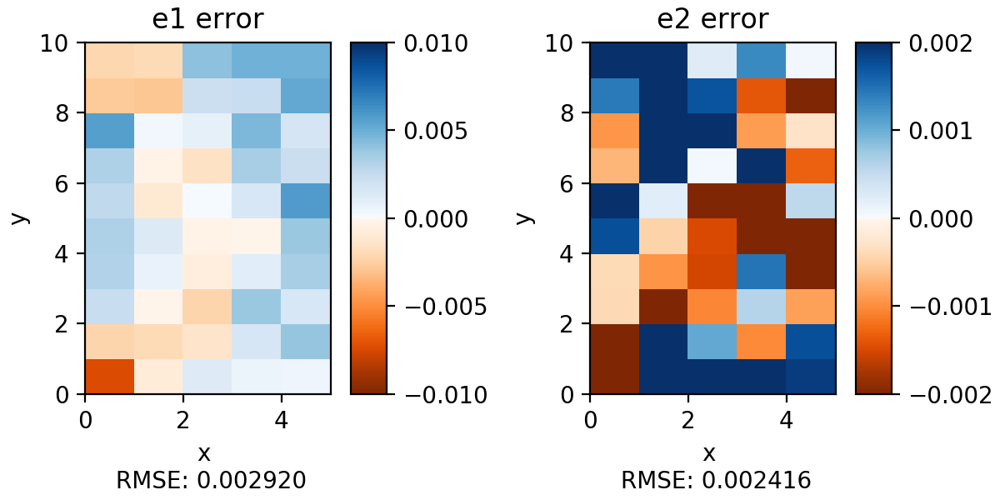

In [10]:
# TL test 12

"""
## TL test 12
Reduced dataset
N_COMP = 16
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 1
N_ITER_RCA = 4 
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_12_path, file_pattern = CFIS_pattern[38], n_starcats = 8, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test12.png')



<IPython.core.display.Javascript object>


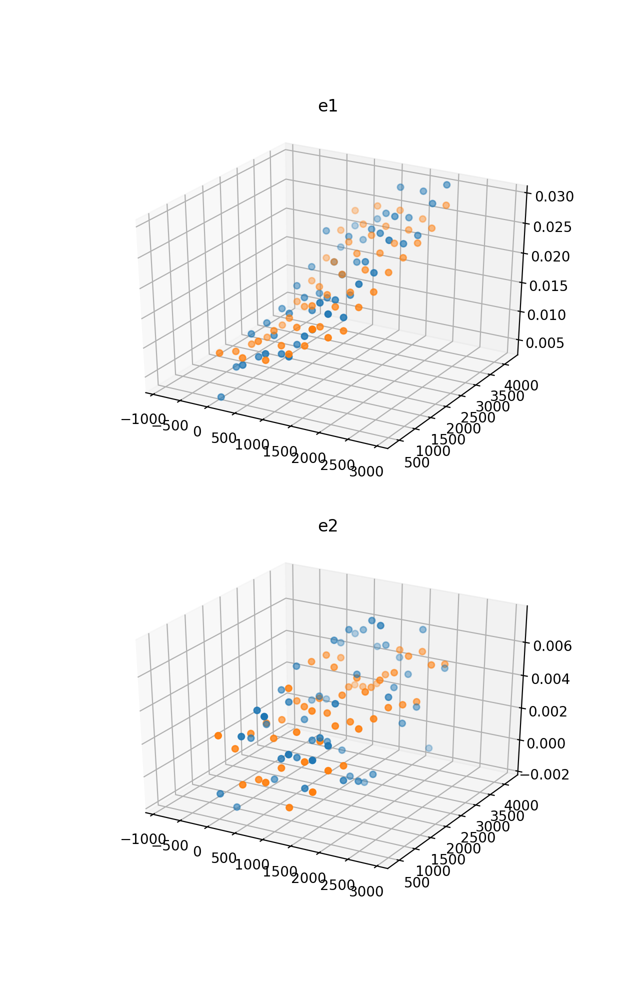

<IPython.core.display.Javascript object>


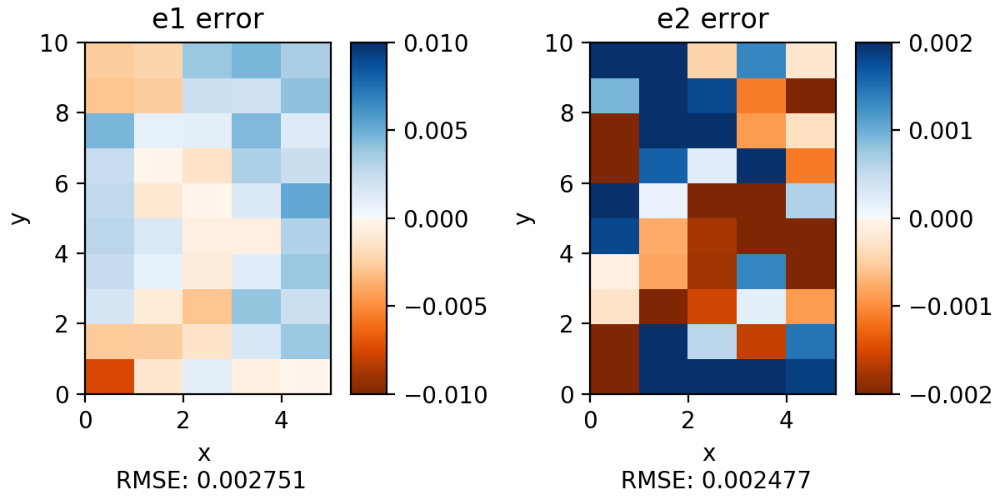

In [11]:
# TL test 13

"""
## TL test 13
Reduced dataset
N_COMP = 16
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 1
N_ITER_RCA = 2
#ALPHA = PSFEx
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_13_path, file_pattern = CFIS_pattern[38], n_starcats = 8, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test13.png')

<IPython.core.display.Javascript object>


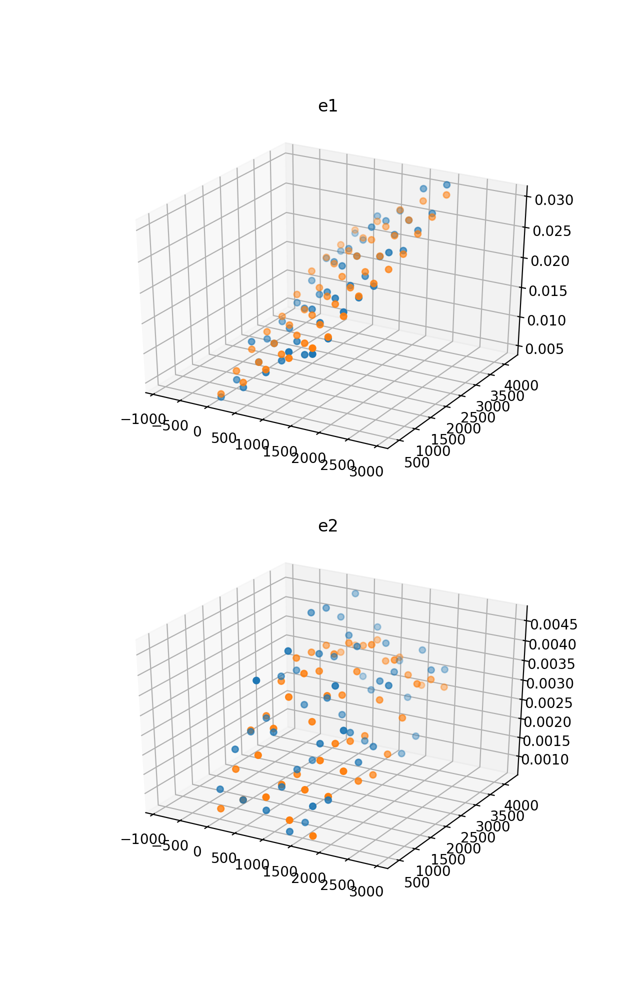

<IPython.core.display.Javascript object>


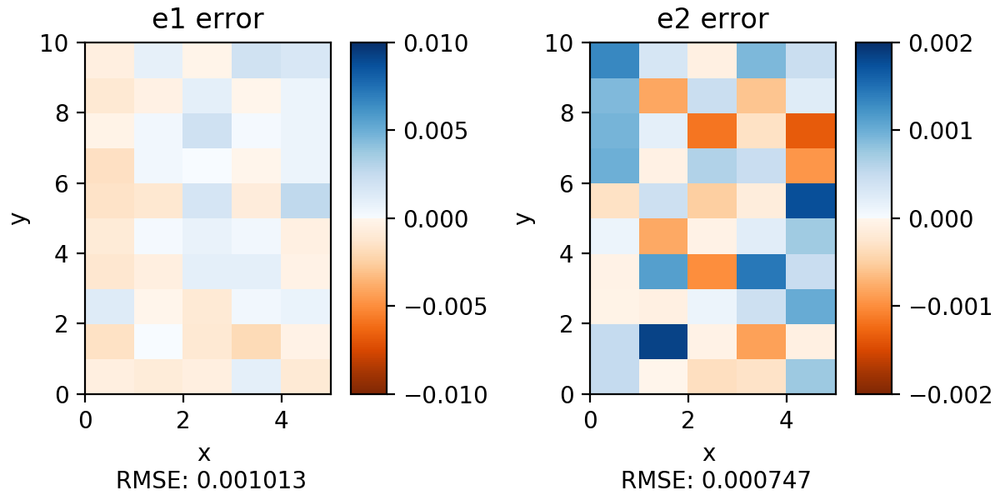

In [12]:
# TL test 14

"""
## TL test 14
Simulated CCD38
N_COMP = 24
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 2 
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_14_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test14.png')

<IPython.core.display.Javascript object>


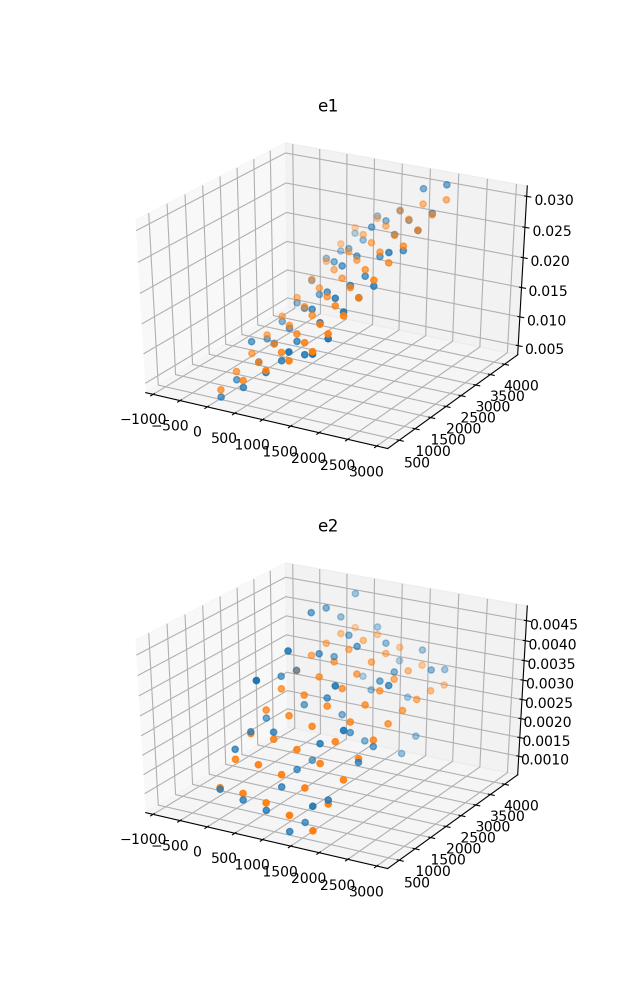

<IPython.core.display.Javascript object>


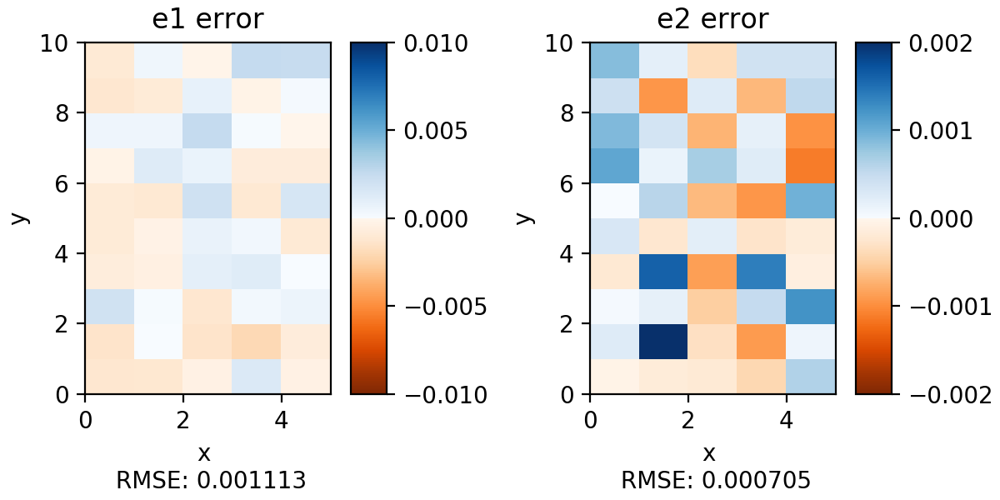

In [13]:
# TL test 15

"""
## TL test 15
Simulated CCD38
N_COMP = 24
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 2 
ALPHA = PSFEx
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_15_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test15.png')

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


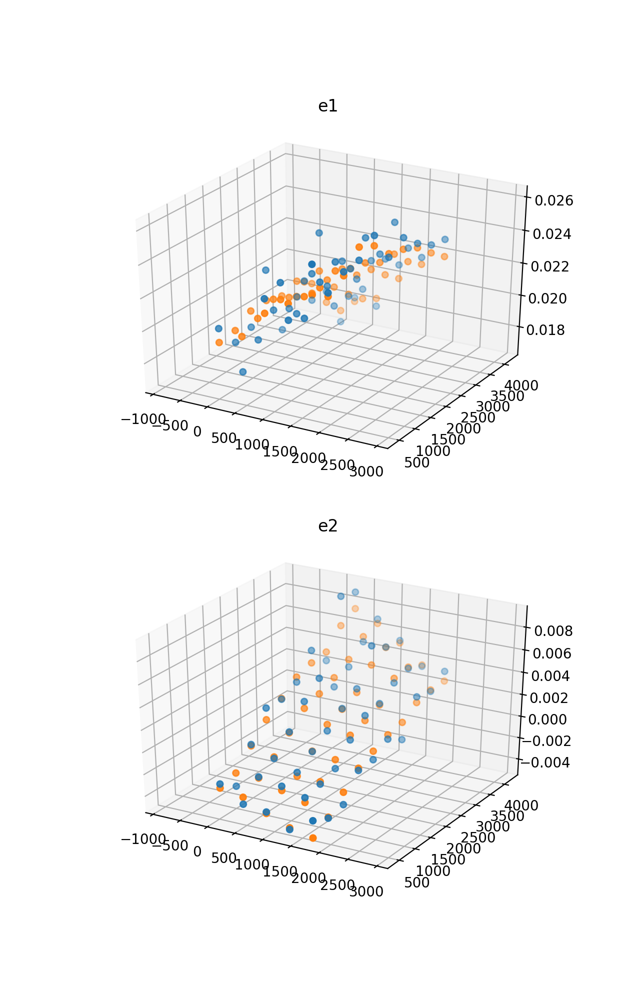

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


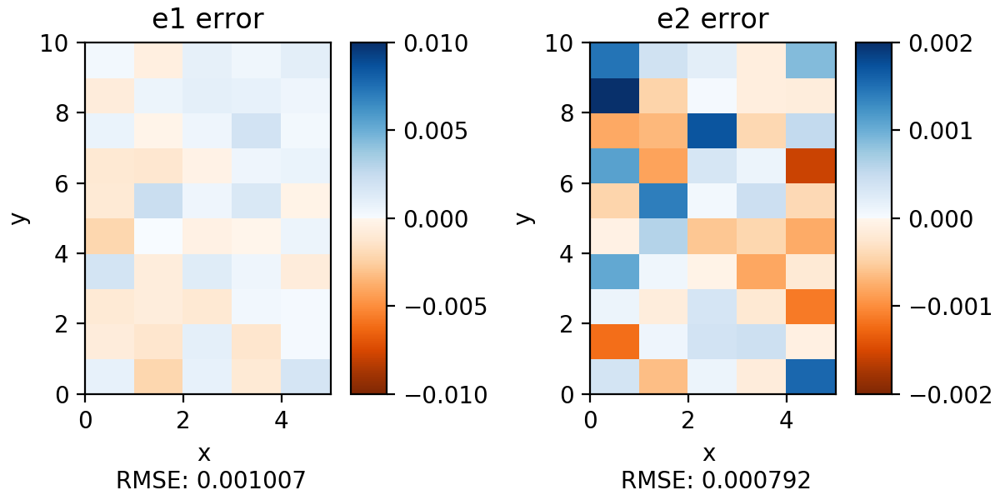

In [14]:
# TL test 16

"""
## TL test 16
Simulated CCD02
N_COMP = 24
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 2 
ALPHA = None
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_16_path, file_pattern = CFIS_pattern[2], n_starcats = 224, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test16.png')

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


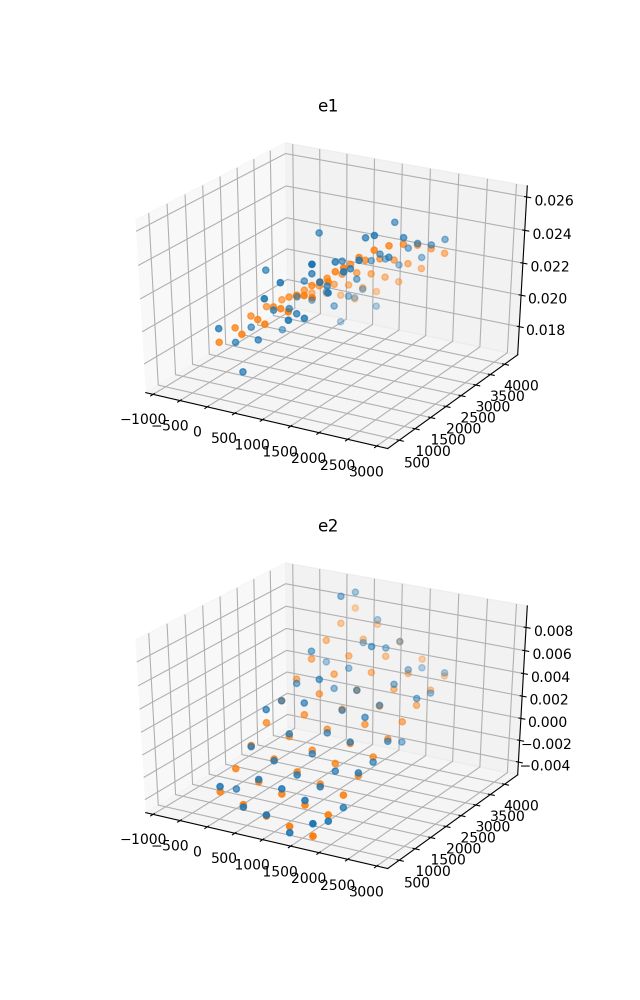

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


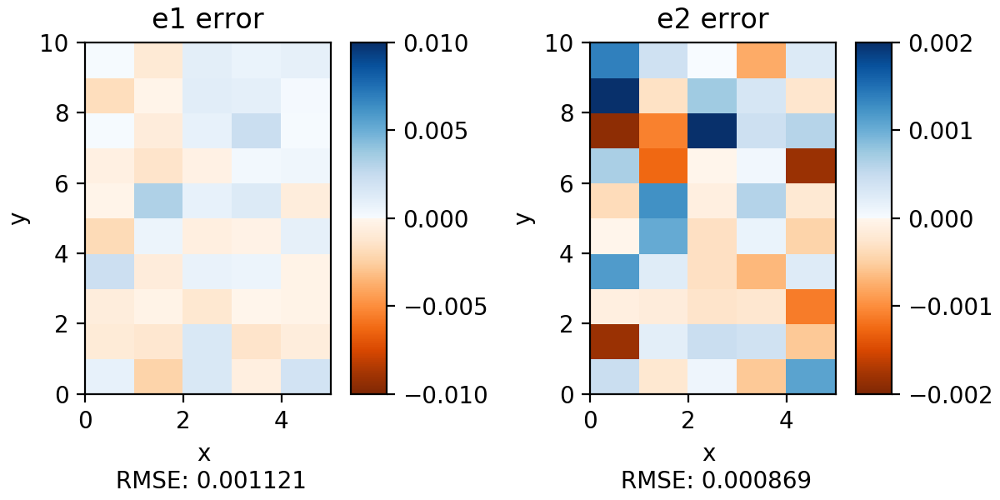

In [15]:
# TL test 17

"""
## TL test 17
Simulated CCD02
N_COMP = 24
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 2 
ALPHA = PSFEx
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_17_path, file_pattern = CFIS_pattern[2], n_starcats = 224, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test17.png')

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


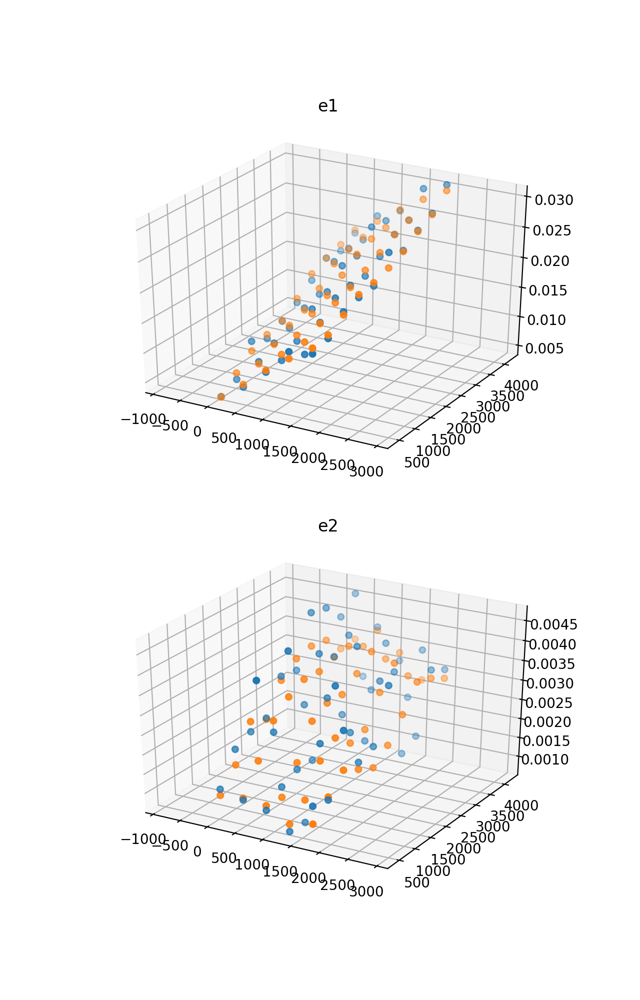

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


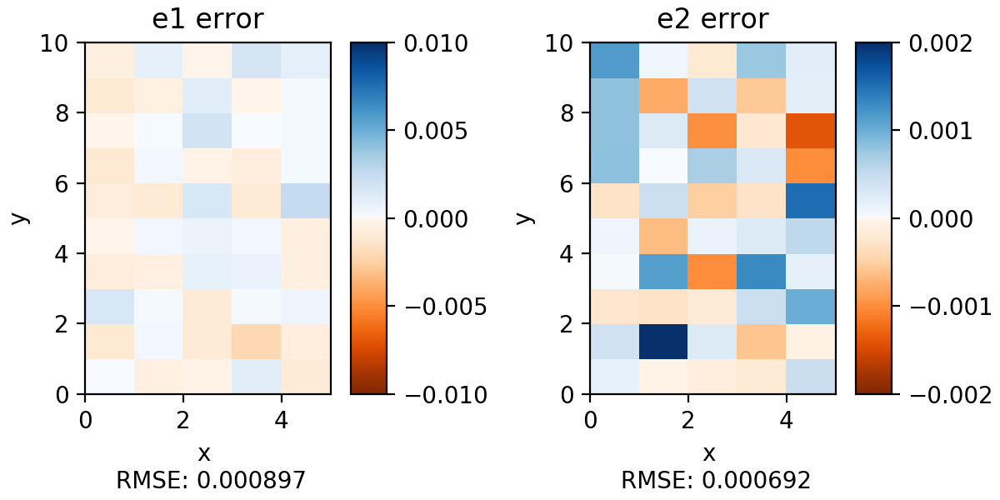

In [16]:
# TL test 18

"""
## TL test 18
Simulated CCD38
N_COMP = 18
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 3 
ALPHA = hybrid_1
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_18_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test18.png')

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


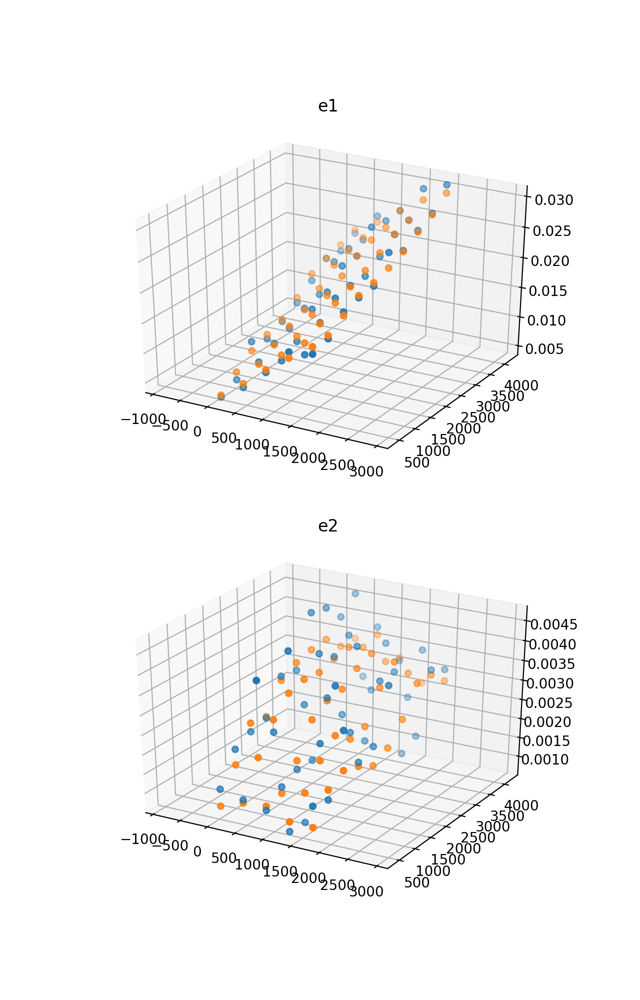

/Users/tliaudat/opt/anaconda3/envs/shapepipe/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


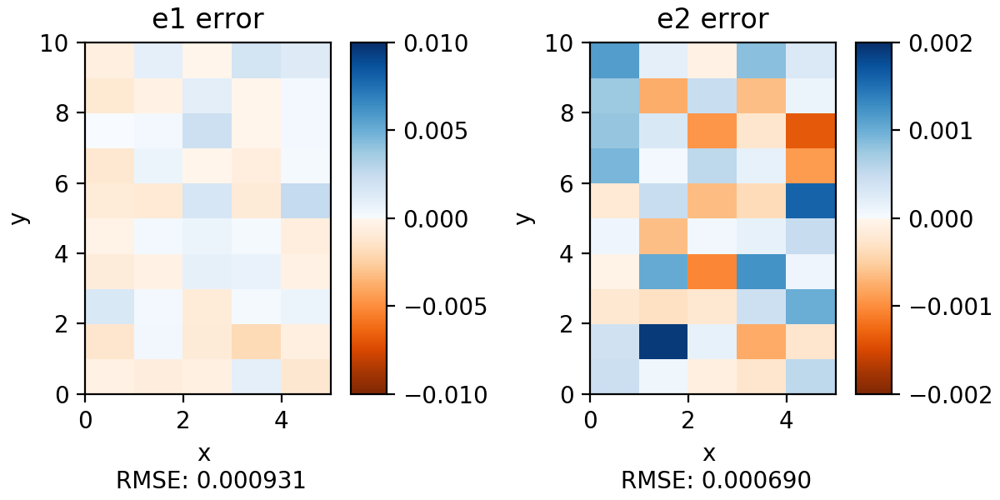

In [17]:
# TL test 19

"""
## TL test 19
Simulated CCD38
N_COMP = 18
PSF_SIZE = 3.6
N_EIGENVECTS = 5
KSIG = 0.1
N_ITER_RCA = 3 
ALPHA = hybrid_2
FILTER_PATH = None
"""

e1_err_1, e2_err_1, X, Y = plot_ell(TL_test_19_path, file_pattern = CFIS_pattern[38], n_starcats = 225, n_test_stars = 50)
e1_mat_1, e2_mat_1 = gen_err_mat(e1_err_1, e2_err_1, X, Y)
plot_color2d(e1_mat_1, e2_mat_1, 'TL_test19.png')